## Exploratory Data Analysis - US Wildfires

In [1]:
# load packages
import pandas as pd
import numpy as np
from scipy import stats
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from scipy.stats import zscore
import plotly.express as px 
sns.set()

### US Historic Wildfires
Look at the original US wildfires dataset and features

In [2]:
# load US wildfire data (1992-2015)
us_fire = pd.read_csv('NIFC_1992-2015_fire.csv')

print(us_fire.shape)
us_fire.head()

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3044: DtypeWarning:

Columns (10,12,13,14,15,16,17,18,19,20,37,39) have mixed types. Specify dtype option on import or set low_memory=False.



(1880465, 40)


,X,Y,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,...,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME
0,-121.005833,40.036944,1,1,FS-1418826,FED,FS-FIRESTAT,FS,USCAPNF,Plumas National Forest,...,0.10,A,40.036944,-121.005833,5,USFS,CA,63,63.0,Plumas
1,-120.404444,38.933056,2,2,FS-1418827,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,...,0.25,A,38.933056,-120.404444,5,USFS,CA,61,61.0,Placer
2,-120.735556,38.984167,3,3,FS-1418835,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,...,0.10,A,38.984167,-120.735556,13,STATE OR PRIVATE,CA,17,17.0,El Dorado
3,-119.913333,38.559167,4,4,FS-1418845,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,...,0.10,A,38.559167,-119.913333,5,USFS,CA,3,3.0,Alpine
4,-119.933056,38.559167,5,5,FS-1418847,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,...,0.10,A,38.559167,-119.933056,5,USFS,CA,3,3.0,Alpine


In [3]:
# summary statistics
us_fire.describe()

,X,Y,OBJECTID,FOD_ID,FIRE_YEAR,DISCOVERY_DOY,DISCOVERY_TIME,STAT_CAUSE_CODE,CONT_DOY,CONT_TIME,FIRE_SIZE,LATITUDE,LONGITUDE,OWNER_CODE,FIPS_CODE
count,1.880465e+06,1.880465e+06,1.880465e+06,1.880465e+06,1.880465e+06,1.880465e+06,997827.000000,1.880465e+06,988934.000000,907912.000000,1.880465e+06,1.880465e+06,1.880465e+06,1.880465e+06,1.202317e+06
mean,-9.570494e+01,3.678121e+01,9.402330e+05,5.484020e+07,2.003710e+03,1.647191e+02,1453.014326,5.979037e+00,172.656766,1534.832080,7.452016e+01,3.678121e+01,-9.570494e+01,1.059658e+01,9.578350e+01
std,1.671694e+01,6.139031e+00,5.428436e+05,1.011963e+08,6.663099e+00,9.003891e+01,405.960963,3.483860e+00,84.320348,432.737694,2.497598e+03,6.139031e+00,1.671694e+01,4.404662e+00,9.861505e+01
min,-1.788026e+02,1.793972e+01,1.000000e+00,1.000000e+00,1.992000e+03,1.000000e+00,0.000000,1.000000e+00,1.000000,0.000000,1.000000e-05,1.793972e+01,-1.788026e+02,0.000000e+00,1.000000e+00
25%,-1.103635e+02,3.281860e+01,4.701170e+05,5.055000e+05,1.998000e+03,8.900000e+01,1240.000000,3.000000e+00,102.000000,1310.000000,1.000000e-01,3.281860e+01,-1.103635e+02,8.000000e+00,2.900000e+01
50%,-9.204304e+01,3.545250e+01,9.402330e+05,1.067761e+06,2.004000e+03,1.640000e+02,1457.000000,5.000000e+00,181.000000,1600.000000,1.000000e+00,3.545250e+01,-9.204304e+01,1.400000e+01,6.700000e+01
75%,-8.229760e+01,4.082720e+01,1.410349e+06,1.910639e+07,2.009000e+03,2.300000e+02,1708.000000,9.000000e+00,232.000000,1810.000000,3.300000e+00,4.082720e+01,-8.229760e+01,1.400000e+01,1.210000e+02
max,-6.525694e+01,7.033060e+01,1.880465e+06,3.003484e+08,2.015000e+03,3.660000e+02,2359.000000,1.300000e+01,366.000000,2359.000000,6.069450e+05,7.033060e+01,-6.525694e+01,1.500000e+01,8.100000e+02


In [9]:
# data type
us_fire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1880465 entries, 0 to 1880464
Data columns (total 40 columns):
X                             float64
Y                             float64
OBJECTID                      int64
FOD_ID                        int64
FPA_ID                        object
SOURCE_SYSTEM_TYPE            object
SOURCE_SYSTEM                 object
NWCG_REPORTING_AGENCY         object
NWCG_REPORTING_UNIT_ID        object
NWCG_REPORTING_UNIT_NAME      object
SOURCE_REPORTING_UNIT         object
SOURCE_REPORTING_UNIT_NAME    object
LOCAL_FIRE_REPORT_ID          object
LOCAL_INCIDENT_ID             object
FIRE_CODE                     object
FIRE_NAME                     object
ICS_209_INCIDENT_NUMBER       object
ICS_209_NAME                  object
MTBS_ID                       object
MTBS_FIRE_NAME                object
COMPLEX_NAME                  object
FIRE_YEAR                     int64
DISCOVERY_DATE                object
DISCOVERY_DOY                 int64
D

In [10]:
# null values
us_fire.isnull().sum()

X                                   0
Y                                   0
OBJECTID                            0
FOD_ID                              0
FPA_ID                              0
SOURCE_SYSTEM_TYPE                  0
SOURCE_SYSTEM                       0
NWCG_REPORTING_AGENCY               0
NWCG_REPORTING_UNIT_ID              0
NWCG_REPORTING_UNIT_NAME            0
SOURCE_REPORTING_UNIT               0
SOURCE_REPORTING_UNIT_NAME          0
LOCAL_FIRE_REPORT_ID          1459286
LOCAL_INCIDENT_ID              820821
FIRE_CODE                     1555741
FIRE_NAME                      960479
ICS_209_INCIDENT_NUMBER       1854748
ICS_209_NAME                  1854748
MTBS_ID                       1869462
MTBS_FIRE_NAME                1869462
COMPLEX_NAME                  1875282
FIRE_YEAR                           0
DISCOVERY_DATE                      0
DISCOVERY_DOY                       0
DISCOVERY_TIME                 882638
STAT_CAUSE_CODE                     0
STAT_CAUSE_D

<IPython.core.display.Javascript object>


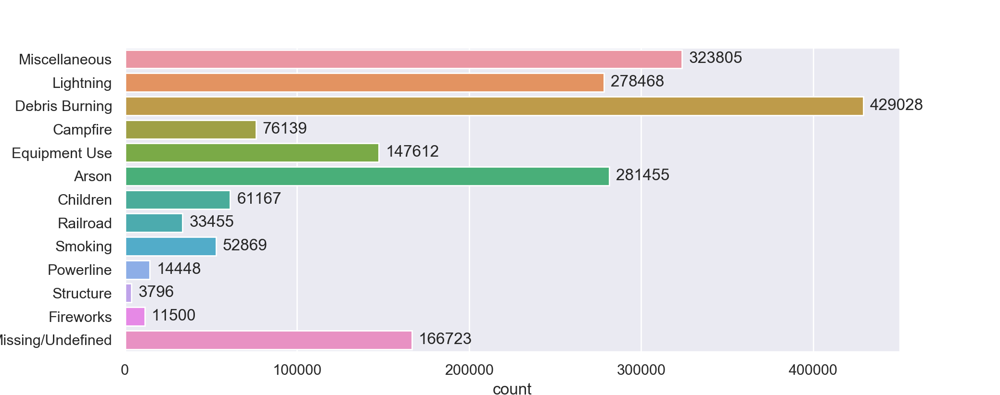

In [24]:
# causes counts
plt.figure(figsize=(5,5))
ax=sns.countplot(y='STAT_CAUSE_DESCR', data=us_fire)
for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center");

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: using a dict on a Series for aggregation
is deprecated and will be removed in a future version
  


<IPython.core.display.Javascript object>


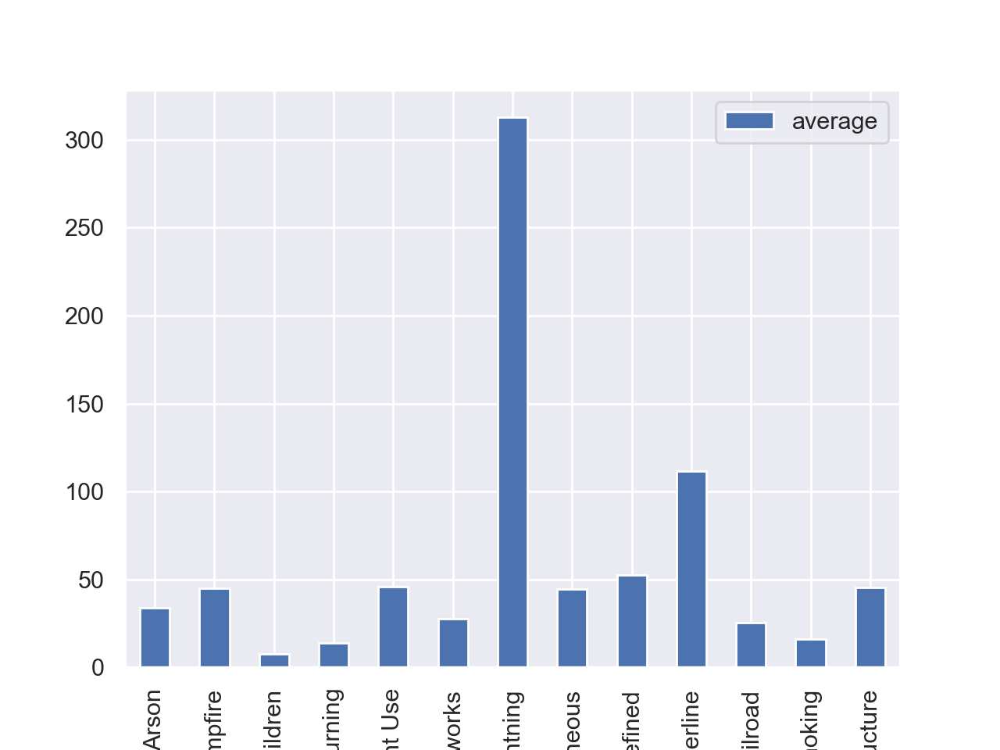

In [12]:
# average size by cause
us_fire.groupby('STAT_CAUSE_DESCR')['FIRE_SIZE'].agg({'average': 'mean'}).plot(kind='bar');

<IPython.core.display.Javascript object>


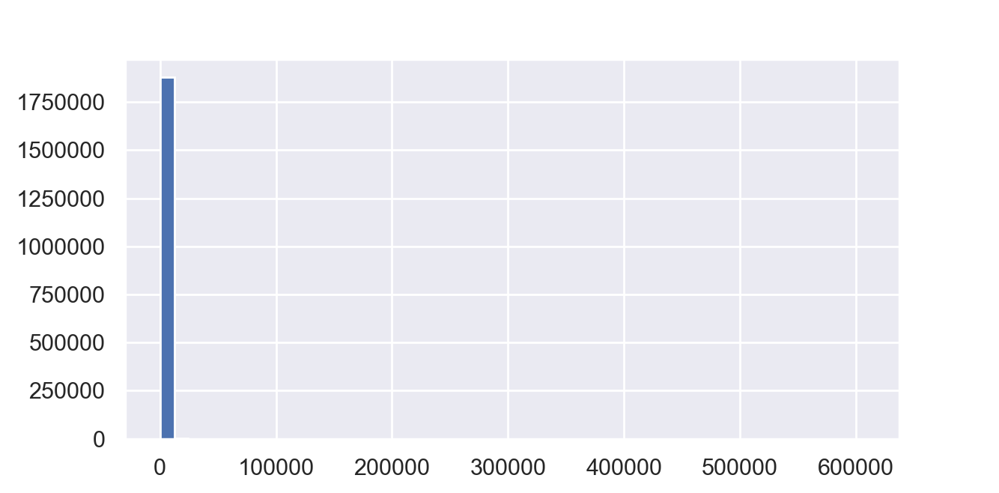

In [17]:
# look at distribution of fire size
plt.figure(figsize=(5,5))
us_fire['FIRE_SIZE'].hist(bins=50);

<IPython.core.display.Javascript object>


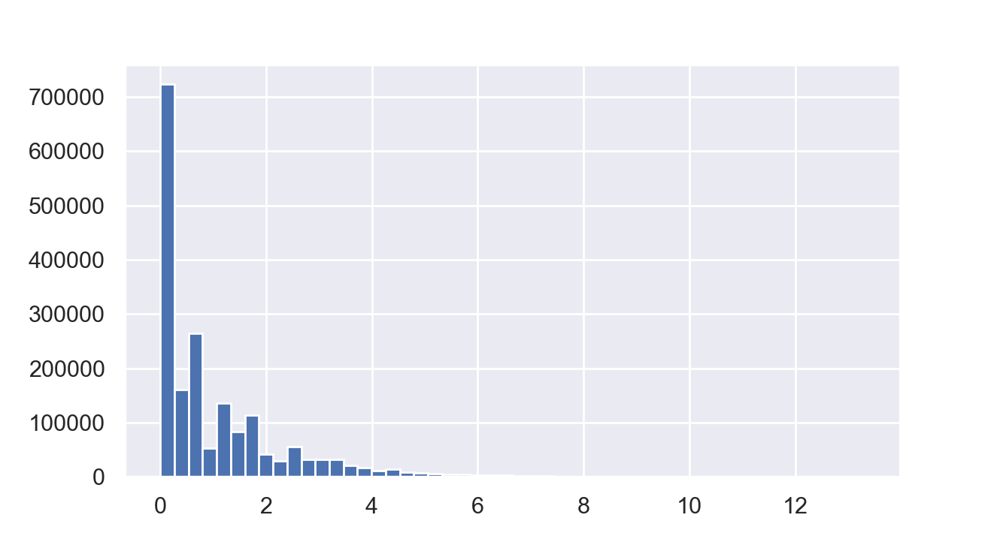

In [18]:
# log distribution fire size (better visualize)
plt.figure(figsize=(5,5))
np.log(us_fire['FIRE_SIZE']+1).hist(bins=50);

<IPython.core.display.Javascript object>


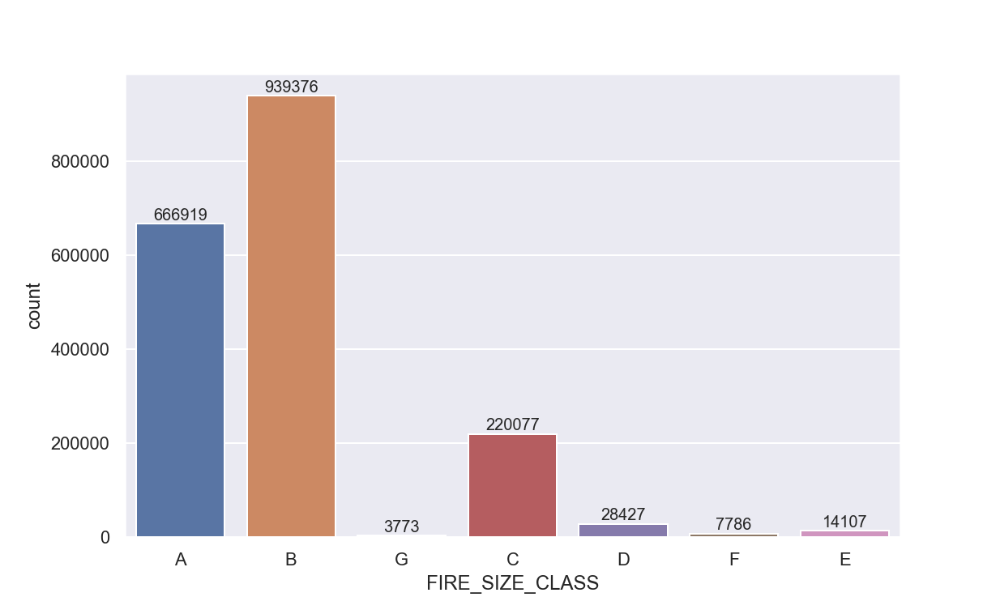

In [24]:
# fire size class
ax=sns.countplot(x="FIRE_SIZE_CLASS", data=us_fire)
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


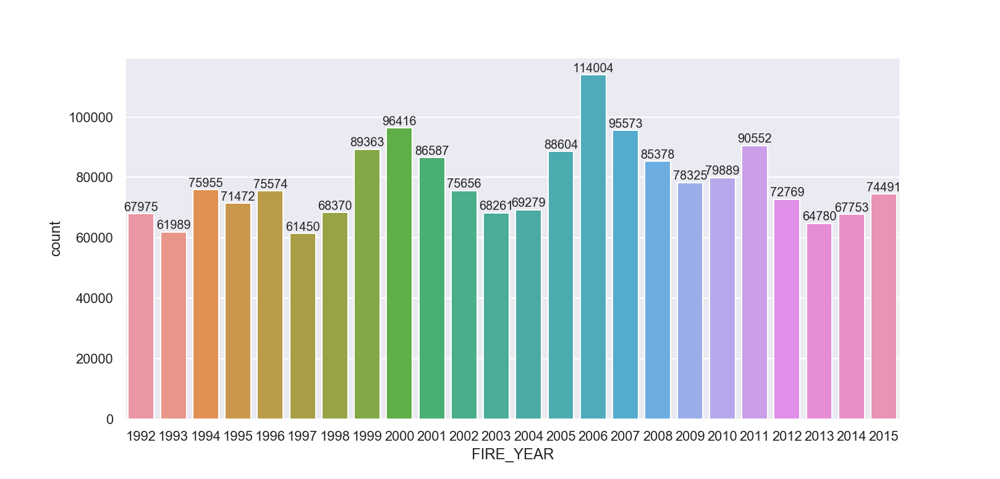

In [23]:
# fire counts by year
ax=sns.countplot(x="FIRE_YEAR", data=us_fire)
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


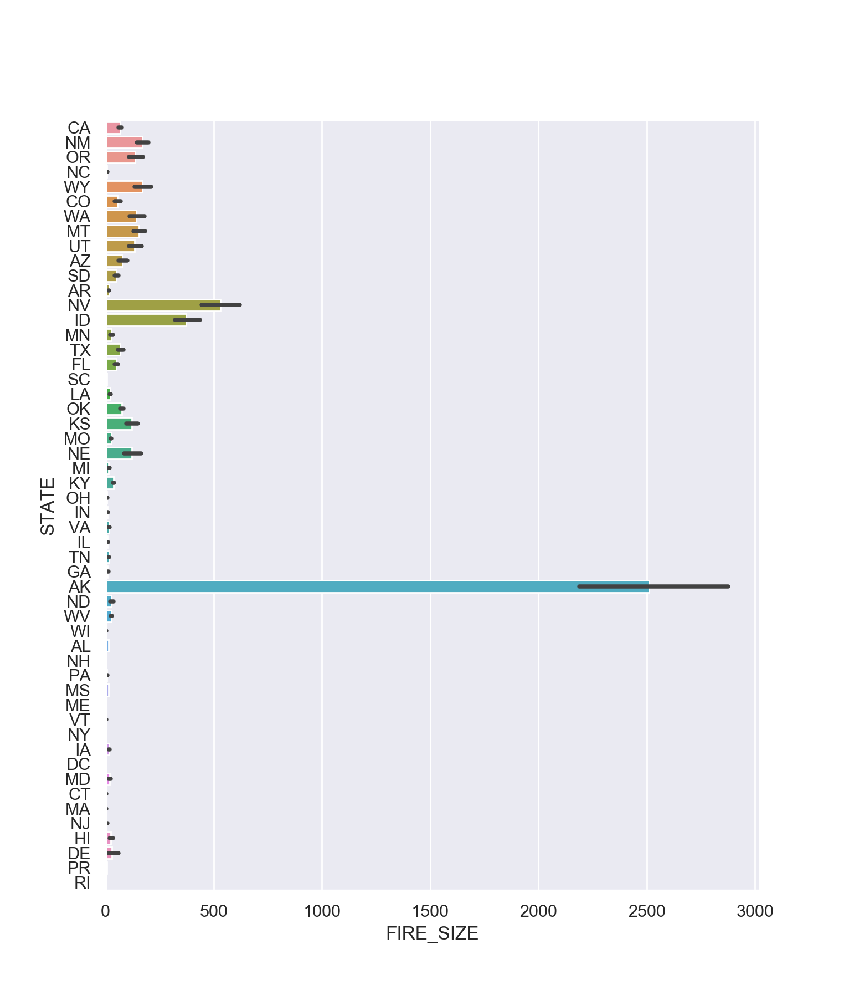

In [4]:
# total size by state
sns.barplot(y="STATE", x='FIRE_SIZE', data=us_fire);

<IPython.core.display.Javascript object>


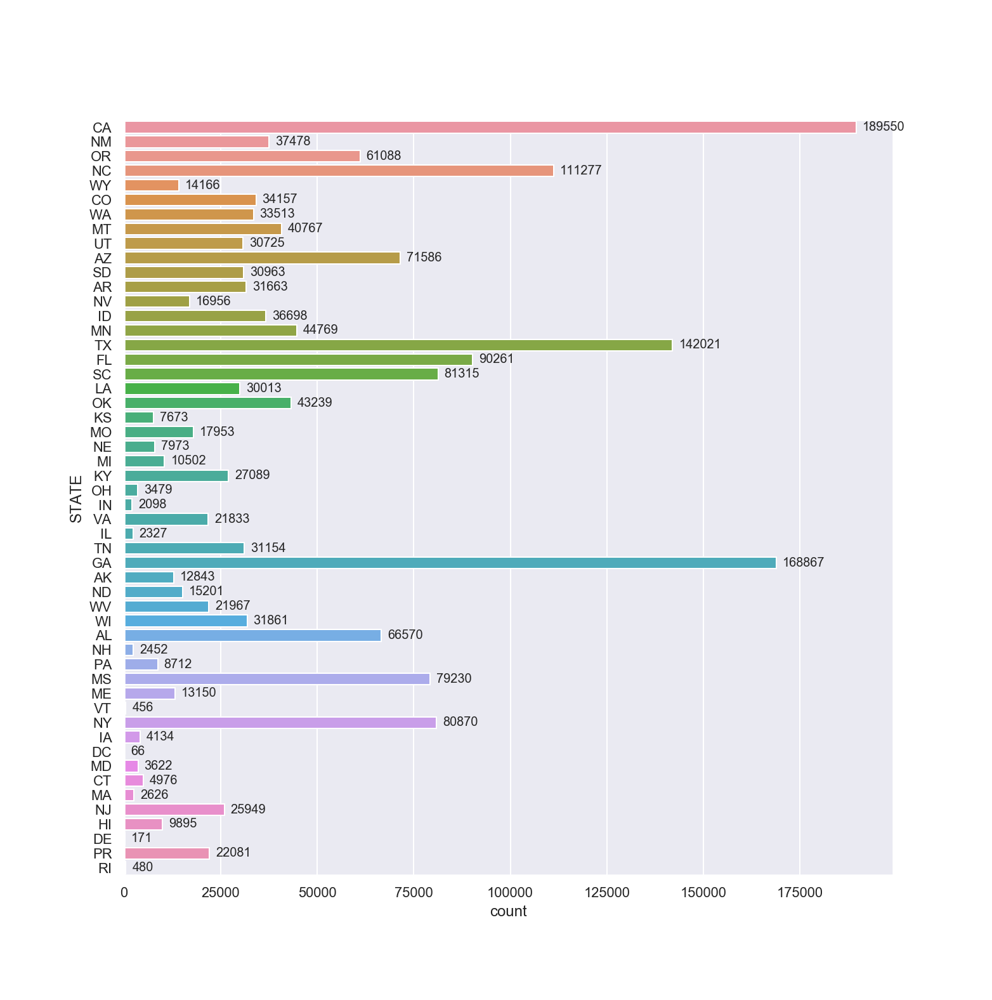

In [53]:
# see count of fires by state
ax=sns.countplot(y="STATE", data=us_fire)
for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center");

In [23]:
# get of CA incidents - data subset
len(us_fire[us_fire.STATE == 'CA'])

189550

### California Wildfires
Subset of original US wildfires data from 1992-2015

In [13]:
# subset data to CA
cal_fire = us_fire[us_fire.STATE == 'CA']
cal_fire.head()

,X,Y,OBJECTID,FOD_ID,FPA_ID,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,NWCG_REPORTING_AGENCY,NWCG_REPORTING_UNIT_ID,NWCG_REPORTING_UNIT_NAME,...,FIRE_SIZE,FIRE_SIZE_CLASS,LATITUDE,LONGITUDE,OWNER_CODE,OWNER_DESCR,STATE,COUNTY,FIPS_CODE,FIPS_NAME
0,-121.005833,40.036944,1,1,FS-1418826,FED,FS-FIRESTAT,FS,USCAPNF,Plumas National Forest,...,0.10,A,40.036944,-121.005833,5,USFS,CA,63,63.0,Plumas
1,-120.404444,38.933056,2,2,FS-1418827,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,...,0.25,A,38.933056,-120.404444,5,USFS,CA,61,61.0,Placer
2,-120.735556,38.984167,3,3,FS-1418835,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,...,0.10,A,38.984167,-120.735556,13,STATE OR PRIVATE,CA,17,17.0,El Dorado
3,-119.913333,38.559167,4,4,FS-1418845,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,...,0.10,A,38.559167,-119.913333,5,USFS,CA,3,3.0,Alpine
4,-119.933056,38.559167,5,5,FS-1418847,FED,FS-FIRESTAT,FS,USCAENF,Eldorado National Forest,...,0.10,A,38.559167,-119.933056,5,USFS,CA,3,3.0,Alpine


In [29]:
cal_fire.columns

Index(['X', 'Y', 'OBJECTID', 'FOD_ID', 'FPA_ID', 'SOURCE_SYSTEM_TYPE',
       'SOURCE_SYSTEM', 'NWCG_REPORTING_AGENCY', 'NWCG_REPORTING_UNIT_ID',
       'NWCG_REPORTING_UNIT_NAME', 'SOURCE_REPORTING_UNIT',
       'SOURCE_REPORTING_UNIT_NAME', 'LOCAL_FIRE_REPORT_ID',
       'LOCAL_INCIDENT_ID', 'FIRE_CODE', 'FIRE_NAME',
       'ICS_209_INCIDENT_NUMBER', 'ICS_209_NAME', 'MTBS_ID', 'MTBS_FIRE_NAME',
       'COMPLEX_NAME', 'FIRE_YEAR', 'DISCOVERY_DATE', 'DISCOVERY_DOY',
       'DISCOVERY_TIME', 'STAT_CAUSE_CODE', 'STAT_CAUSE_DESCR', 'CONT_DATE',
       'CONT_DOY', 'CONT_TIME', 'FIRE_SIZE', 'FIRE_SIZE_CLASS', 'LATITUDE',
       'LONGITUDE', 'OWNER_CODE', 'OWNER_DESCR', 'STATE', 'COUNTY',
       'FIPS_CODE', 'FIPS_NAME'],
      dtype='object')

<IPython.core.display.Javascript object>


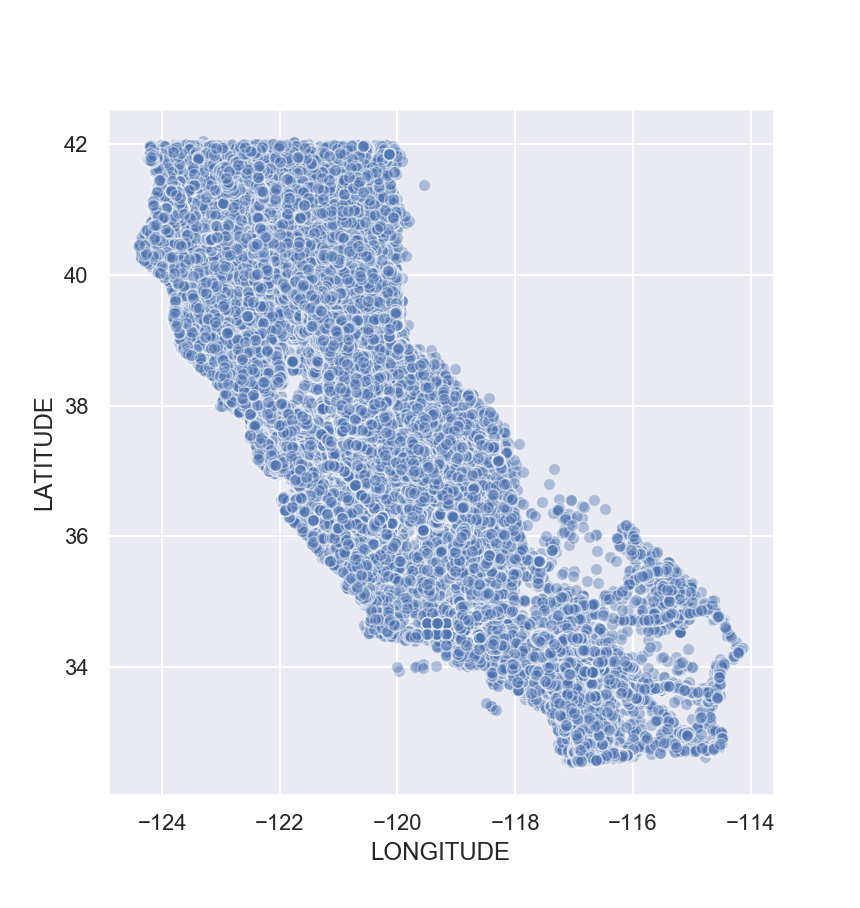

In [35]:
# quick spatial map
sns.scatterplot(x='LONGITUDE', y='LATITUDE', alpha=0.4, data=cal_fire);

<IPython.core.display.Javascript object>


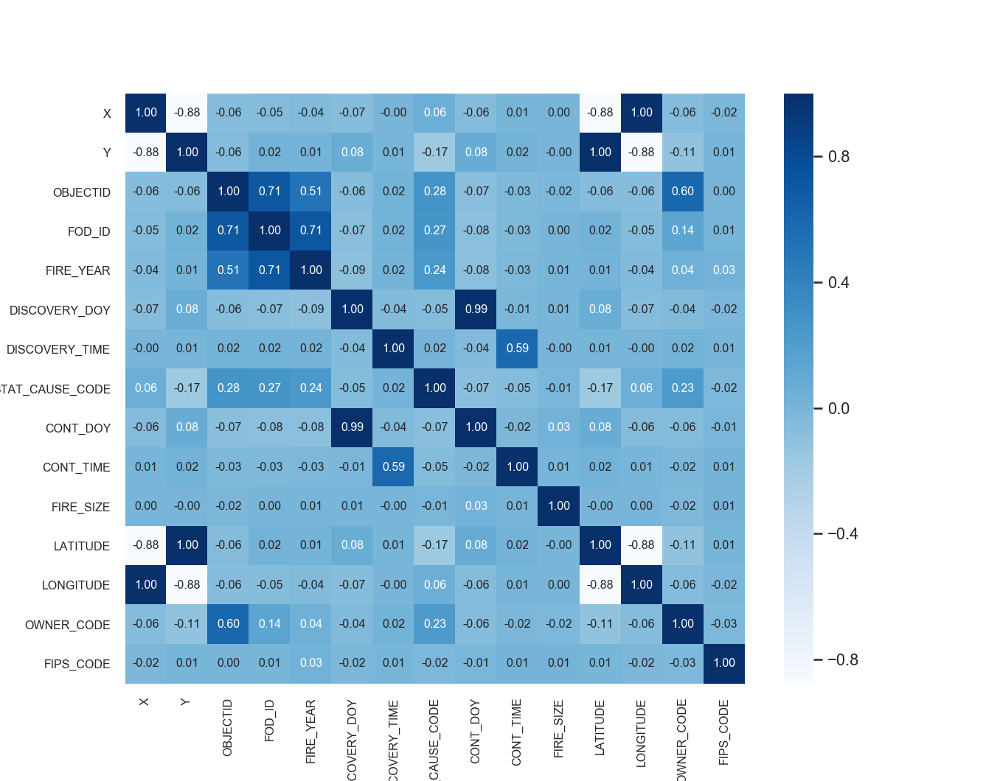

In [36]:
# correlations
sns.heatmap(cal_fire.corr(), fmt='.2f', annot=True, annot_kws={"fontsize":8}, cmap="Blues")
plt.xticks(fontsize=8)
plt.yticks(fontsize=8);

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Users/suryamenon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/suryamenon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the ca

<IPython.core.display.Javascript object>


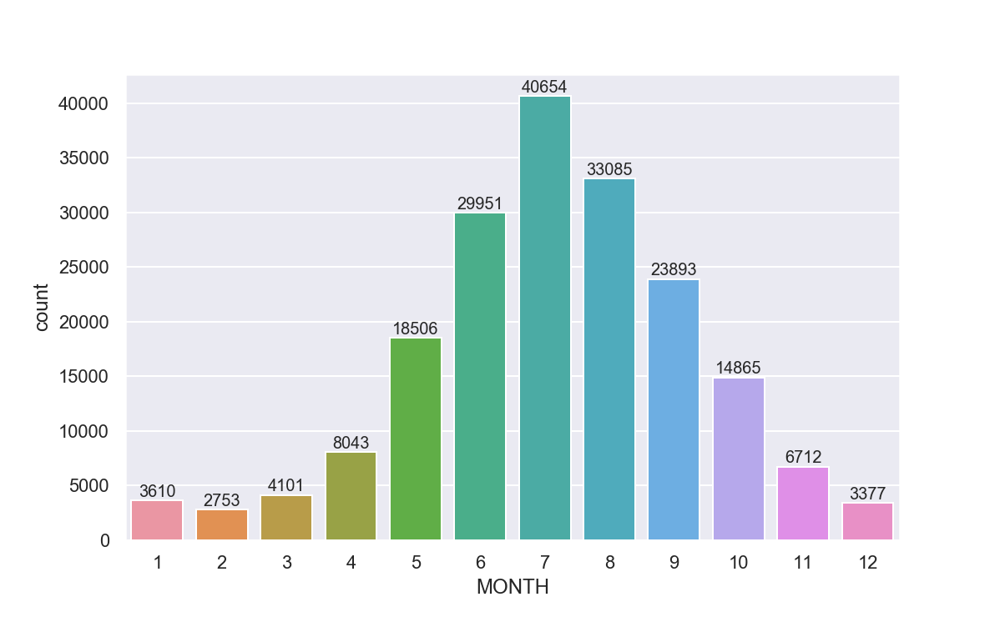

In [50]:
# new time features
cal_fire['DATE'] = pd.to_datetime(cal_fire['DISCOVERY_DATE'])
cal_fire['MONTH'] = cal_fire['DATE'].dt.month
cal_fire['DAY_OF_WEEK'] = cal_fire['DATE'].dt.weekday_name

# count per month
ax=sns.countplot(x=cal_fire['MONTH'])
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


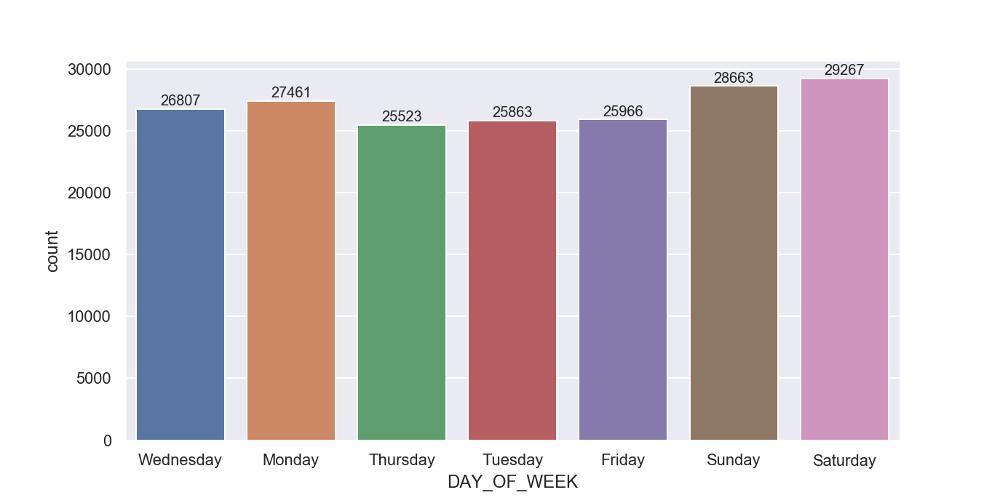

In [51]:
# count per weekday
ax=sns.countplot(x=cal_fire['DAY_OF_WEEK'])
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


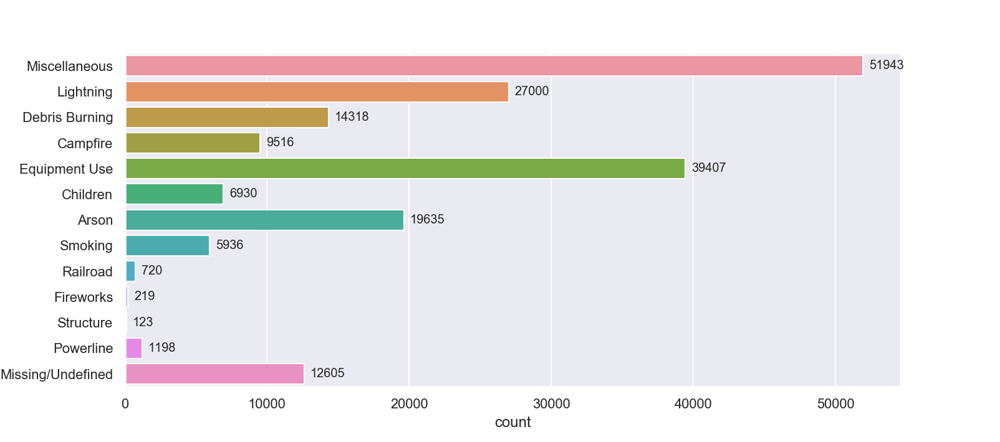

In [28]:
# cal fire causes count (CA)
plt.figure(figsize=(5,5))
ax=sns.countplot(y='STAT_CAUSE_DESCR', data=cal_fire)
for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center");

<IPython.core.display.Javascript object>


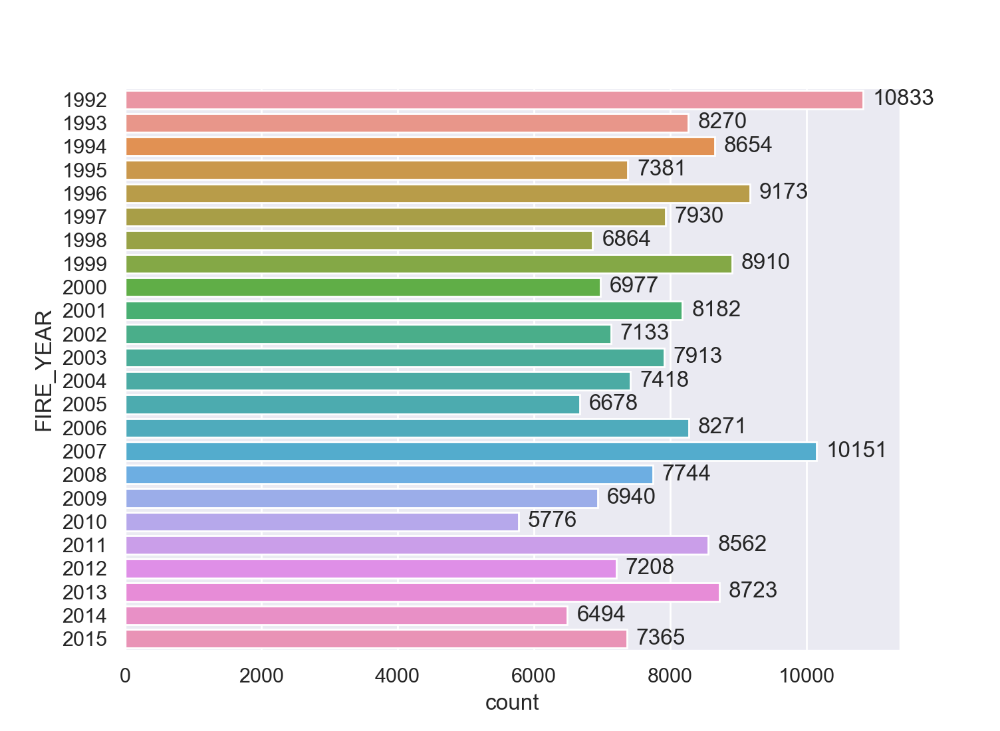

In [14]:
# counts by year (CA)
plt.figure(figsize=(5,5))
ax=sns.countplot(y='FIRE_YEAR', data=cal_fire)
for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center");

In [16]:
# get count of CA incidents after 2000 - data subset
len(cal_fire[cal_fire.FIRE_YEAR >= 2000])

121535

### California Wildfires (after 2000) - including weather data
This is the enhanced data with California subset and weather data added from the National Oceanic and Atmospheric Administration (NOAA)

In [4]:
# load CA fires data with weather variables (temperature, RH) - starting with 2000 to present
cal_temp = pd.read_csv('CA_forestfire_env.csv')

print(cal_temp.shape)
cal_temp.head()

(53145, 29)


,Unnamed: 0,ID,LATITUDE,LONGITUDE,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,FIRE_CODE,FIRE_NAME,FIRE_YEAR,STAT_CAUSE_CODE,...,County,DATE,AWND,DX90,EMXP,EMXT,PRCP,TAVG,TMAX,TMIN
0,0,128764,38.900278,-120.002500,FED,FS-FIRESTAT,8525,WAGON,2000,4,...,El Dorado,2000.0,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5
1,1,128765,38.893889,-120.032222,FED,FS-FIRESTAT,8527,FALLEN,2000,4,...,El Dorado,2000.0,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5
2,2,128766,38.900000,-119.983333,FED,FS-FIRESTAT,8514,HOSPITAL,2000,8,...,El Dorado,2000.0,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5
3,3,128767,39.016944,-120.125000,FED,FS-FIRESTAT,8518,SIERRA,2000,3,...,El Dorado,2000.0,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5
4,4,128768,38.851389,-119.968333,FED,FS-FIRESTAT,8528,ONEIDAS III,2000,4,...,El Dorado,2000.0,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5


In [4]:
# stats
cal_temp.describe()

,Unnamed: 0,ID,LATITUDE,LONGITUDE,FIRE_YEAR,STAT_CAUSE_CODE,FIRE_SIZE,OWNER_CODE,FIPS_CODE,DATE,AWND,DX90,EMXP,EMXT,PRCP,TAVG,TMAX,TMIN
count,53145.000000,5.314500e+04,53145.000000,53145.000000,53145.000000,53145.000000,53145.000000,53145.000000,53145.000000,53078.000000,38492.000000,49780.000000,48282.000000,49780.000000,49947.000000,50733.000000,50518.000000,50746.000000
mean,26572.000000,1.106818e+06,37.408703,-120.023015,2009.932430,6.525449,121.089638,9.965905,56.736607,2009.930009,5.941827,78.008276,1.743019,104.190538,17.421683,60.453181,73.163932,47.689661
std,15341.784365,7.064049e+05,2.652072,2.138936,4.191834,4.243133,3133.929358,4.381878,29.999455,4.193649,1.614796,62.618349,1.117629,10.617631,15.261720,9.391801,9.848898,9.545998
min,0.000000,0.000000e+00,32.544965,-124.402883,2000.000000,1.000000,0.010000,1.000000,1.000000,2000.000000,1.800000,0.000000,0.050000,72.000000,0.080000,40.700000,47.900000,25.000000
25%,13286.000000,3.152150e+05,34.525833,-121.583367,2007.000000,2.000000,0.100000,5.000000,35.000000,2007.000000,5.400000,15.000000,0.910000,98.000000,5.260000,53.900000,66.900000,41.200000
50%,26572.000000,1.511354e+06,37.868149,-120.438300,2011.000000,7.000000,0.110000,13.000000,61.000000,2011.000000,5.800000,82.000000,1.390000,106.000000,11.850000,61.200000,74.000000,48.600000
75%,39858.000000,1.655820e+06,39.463983,-118.179600,2013.000000,9.000000,1.000000,14.000000,73.000000,2013.000000,6.700000,119.000000,2.370000,111.000000,26.670000,65.300000,78.400000,52.900000
max,53144.000000,1.872304e+06,42.007800,-114.140200,2015.000000,13.000000,315578.800000,15.000000,115.000000,2015.000000,10.500000,195.000000,9.000000,125.000000,87.800000,77.600000,90.300000,68.400000


In [5]:
cal_temp.columns

Index(['Unnamed: 0', 'ID', 'LATITUDE', 'LONGITUDE', 'SOURCE_SYSTEM_TYPE',
       'SOURCE_SYSTEM', 'FIRE_CODE', 'FIRE_NAME', 'FIRE_YEAR',
       'STAT_CAUSE_CODE', 'STAT_CAUSE_DESCR', 'FIRE_SIZE', 'FIRE_SIZE_CLASS',
       'OWNER_CODE', 'OWNER_DESCR', 'STATE', 'COUNTY', 'FIPS_CODE',
       'FIPS_NAME', 'County', 'DATE', 'AWND', 'DX90', 'EMXP', 'EMXT', 'PRCP',
       'TAVG', 'TMAX', 'TMIN'],
      dtype='object')

<IPython.core.display.Javascript object>


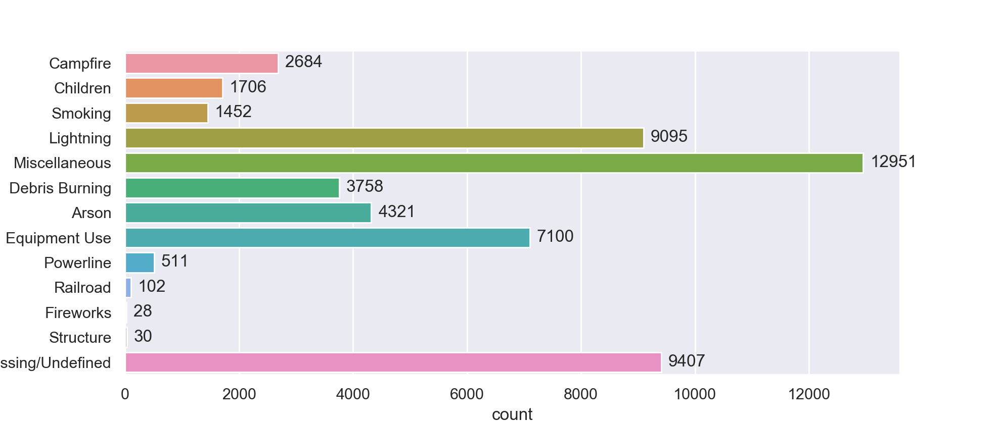

In [6]:
# cal fire causes counts (weather data)
plt.figure(figsize=(5,5))
ax=sns.countplot(y='STAT_CAUSE_DESCR', data=cal_temp)
for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center");

<IPython.core.display.Javascript object>


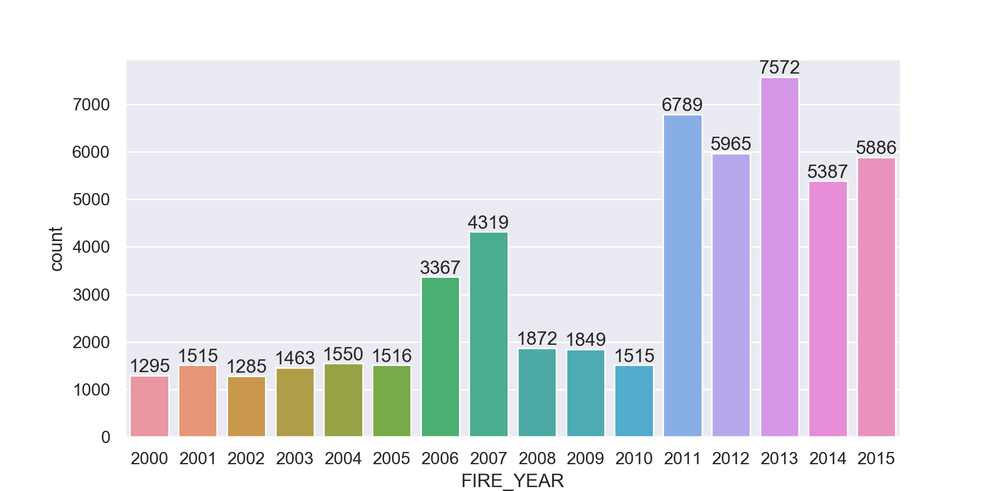

In [7]:
# counts by year (weather data version)
ax=sns.countplot(x=cal_temp['FIRE_YEAR'])
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


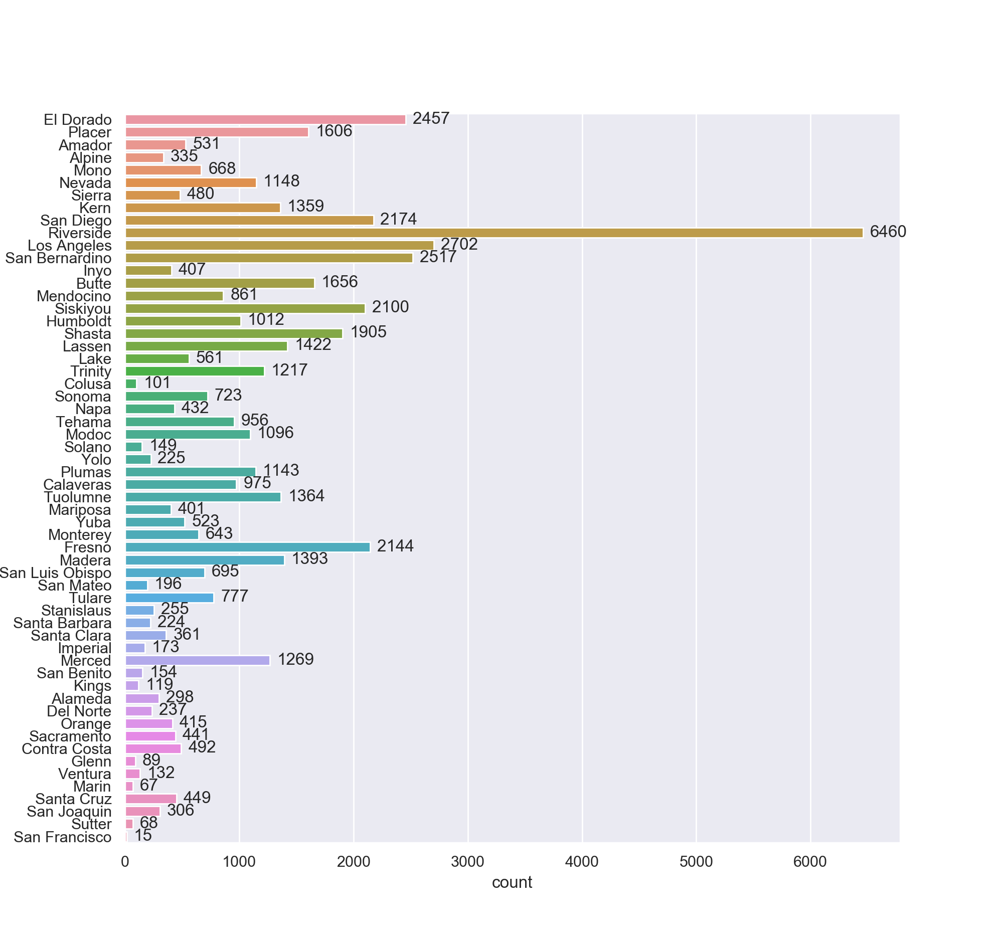

In [8]:
# cal fire by CA counties (weather data version)
plt.figure(figsize=(5,5))
ax=sns.countplot(y='County', data=cal_temp)
for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center");

<IPython.core.display.Javascript object>


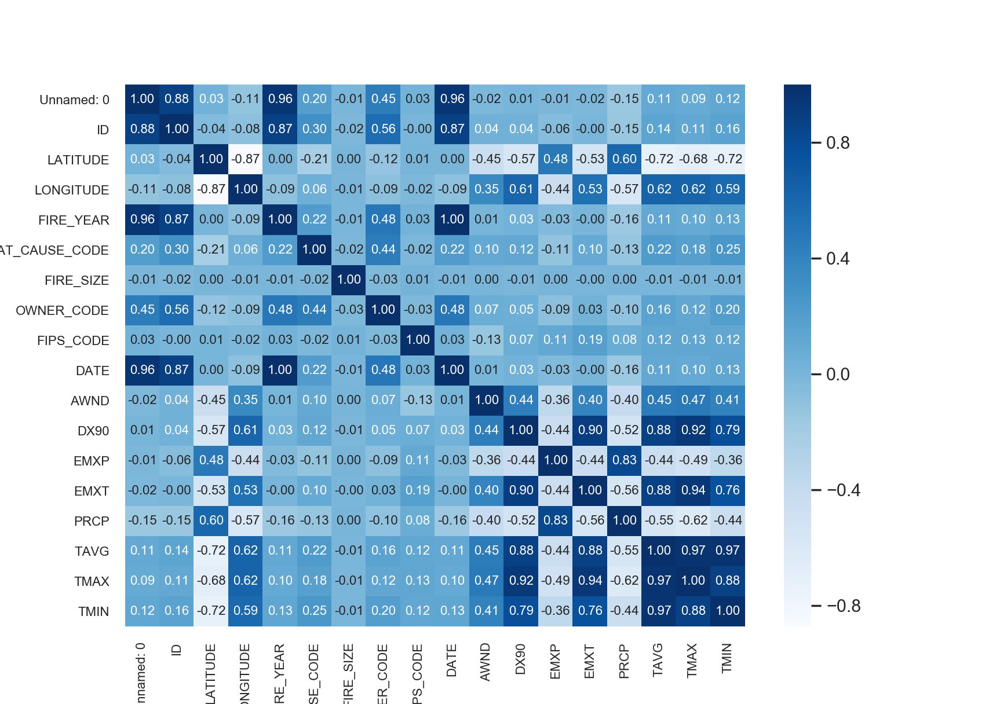

In [17]:
# correlation (weather data version)
sns.heatmap(cal_temp.corr(), fmt='.2f', annot=True, annot_kws={"fontsize":8}, cmap="Blues")
plt.xticks(fontsize=8)
plt.yticks(fontsize=8);

<IPython.core.display.Javascript object>


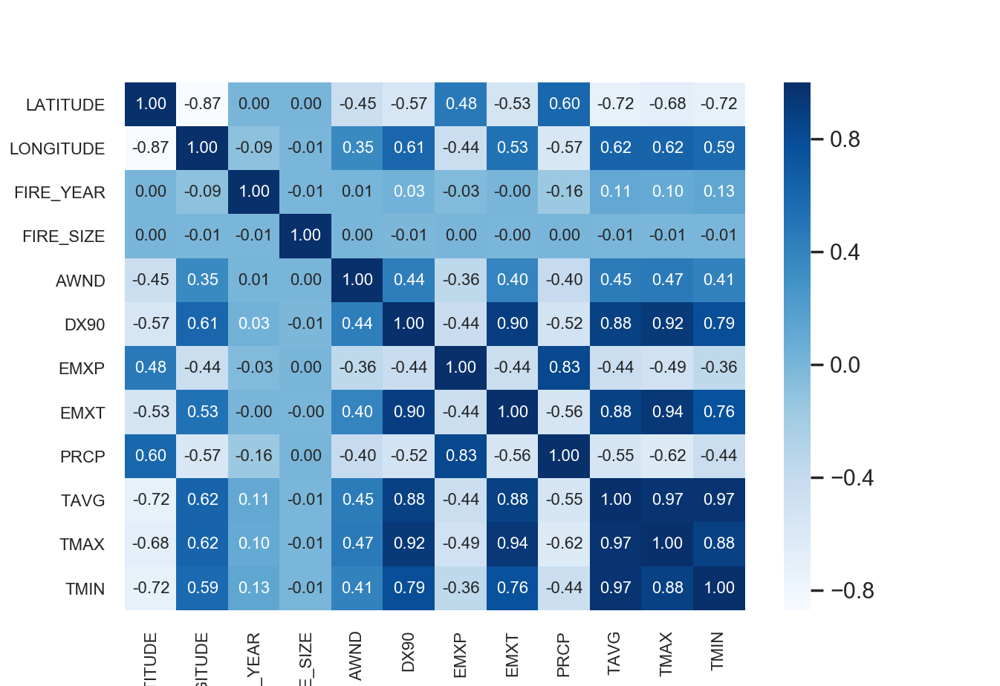

In [18]:
# drop some irrelevant features and re-reun correlation
drop_vars = ['Unnamed: 0', 'ID','STAT_CAUSE_CODE','OWNER_CODE', 'FIPS_CODE', 'DATE']
sns.heatmap(cal_temp.drop(drop_vars, axis=1).corr(), fmt='.2f', annot=True, annot_kws={"fontsize":8}, cmap="Blues")
plt.xticks(fontsize=8)
plt.yticks(fontsize=8);

In [23]:
# look at average values by county - top by size
cal_temp.groupby(['County'])[['FIRE_SIZE', 'TAVG',
                              'PRCP', 'DX90', 'EMXP']].mean().sort_values(['FIRE_SIZE'],ascending=False).head()

,FIRE_SIZE,TAVG,PRCP,DX90,EMXP
County,,,,,
Ventura,2113.776970,62.151515,8.023788,10.727273,1.579394
Santa Barbara,1717.905536,59.385714,9.464196,8.281250,1.659286
Colusa,524.094554,61.113861,16.030891,90.810000,1.344000
Trinity,477.327740,55.586360,31.758332,81.032868,2.217428
Monterey,448.635708,58.667807,10.158087,6.080871,1.389191


In [9]:
cal_temp1 = cal_temp.copy()
cal_temp1['count'] = 1
cal_temp1.groupby(['FIRE_YEAR', "STAT_CAUSE_DESCR"])['ID'].count().reset_index().sort_values(['ID'],ascending=False).head(10)

,FIRE_YEAR,STAT_CAUSE_DESCR,ID
142,2011,Missing/Undefined,2483
167,2013,Missing/Undefined,2203
166,2013,Miscellaneous,1800
154,2012,Missing/Undefined,1579
94,2007,Miscellaneous,1471
153,2012,Miscellaneous,1443
191,2015,Miscellaneous,1436
180,2014,Missing/Undefined,1368
192,2015,Missing/Undefined,1354
190,2015,Lightning,1314


In [ ]:
# plot map - not saved in Jupyter
import plotly.express as px
cal_temp1 = cal_temp.copy()
cal_temp1['count'] = 1
fig = px.bar(cal_temp1.groupby(['FIRE_YEAR', "STAT_CAUSE_DESCR"]).count().reset_index(), x="FIRE_YEAR", y="ID",  
             color="STAT_CAUSE_DESCR", barmode = 'stack') 
  
fig.show()

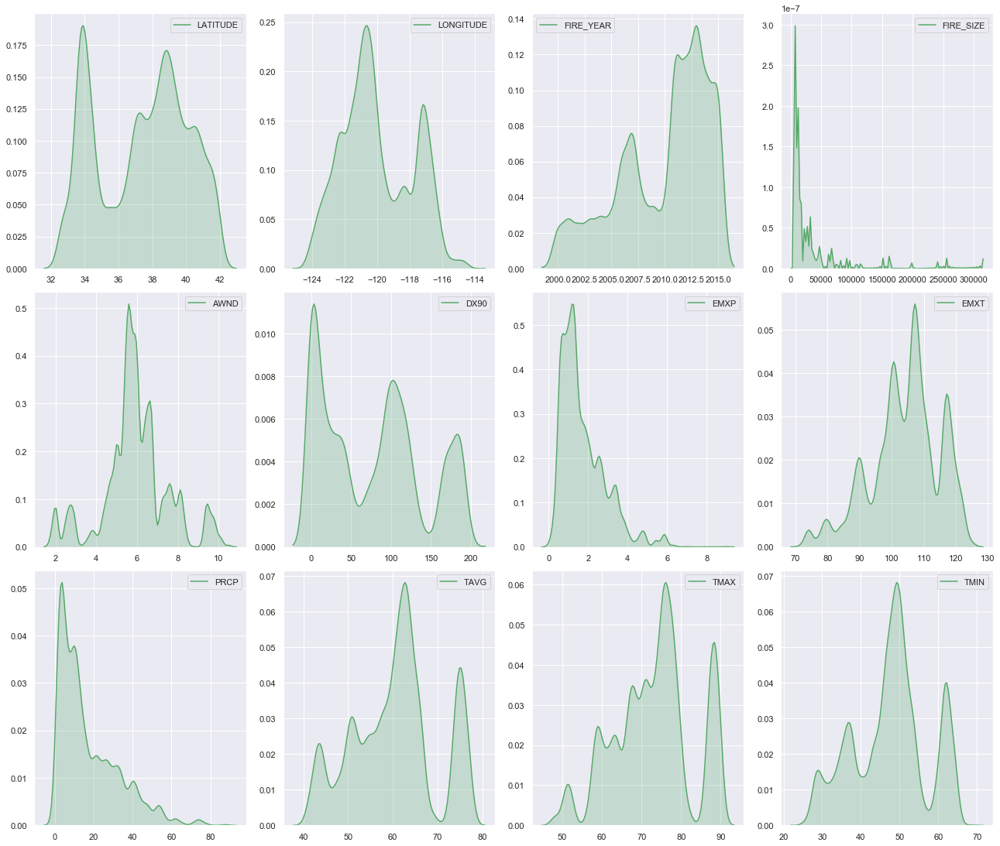

In [41]:
# distribution of numeric columns (weather data version)
%matplotlib inline
num_columns1 = ['LATITUDE', 'LONGITUDE', 'FIRE_YEAR', 'FIRE_SIZE', 'AWND', 'DX90', 
                'EMXP', 'EMXT', 'PRCP', 'TAVG', 'TMAX','TMIN']
plt.figure(figsize=(18,40))
for i,col in enumerate(num_columns1,1):
    plt.subplot(8,4,i)
    sns.kdeplot(cal_temp[col],color='g',shade=True)
plt.tight_layout() 
plt.show()

### California Wildfires - with weather and proximity data
This dataset includes both the added weather data from NOAA plus the nearest fires station metric calculated with GIS analysis

In [10]:
# CA data with temp and proximity analysis (includes meters from nearest fire station)
cali = pd.read_csv('CA_DATA.csv')
print(cali.shape)
cali.head()

(53128, 35)


,ID,LATITUDE,LONGITUDE,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,FIRE_CODE,FIRE_NAME,FIRE_YEAR,DISCOVERY_DATE,DISCOVERY_DOY,...,AWND,DX90,EMXP,EMXT,PRCP,TAVG,TMAX,TMIN,NEAR_FID,NEAR_DIST
0,128764,38.900278,-120.002500,FED,FS-FIRESTAT,8525,WAGON,2000,2000/07/03 00:00:00+00,185,...,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5,1759,1702.002813
1,128765,38.893889,-120.032222,FED,FS-FIRESTAT,8527,FALLEN,2000,2000/07/07 00:00:00+00,189,...,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5,1450,844.446657
2,128766,38.900000,-119.983333,FED,FS-FIRESTAT,8514,HOSPITAL,2000,2000/05/02 00:00:00+00,123,...,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5,99,1141.746990
3,128767,39.016944,-120.125000,FED,FS-FIRESTAT,8518,SIERRA,2000,2000/06/15 00:00:00+00,167,...,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5,172,2029.504605
4,128768,38.851389,-119.968333,FED,FS-FIRESTAT,8528,ONEIDAS III,2000,2000/07/03 00:00:00+00,185,...,5.0,1.0,NaN,91.0,NaN,44.0,59.5,28.5,1868,4435.980601


In [6]:
cali.columns

Index(['ID', 'LATITUDE', 'LONGITUDE', 'SOURCE_SYSTEM_TYPE', 'SOURCE_SYSTEM',
       'FIRE_CODE', 'FIRE_NAME', 'FIRE_YEAR', 'DISCOVERY_DATE',
       'DISCOVERY_DOY', 'DISCOVERY_TIME', 'STAT_CAUSE_CODE',
       'STAT_CAUSE_DESCR', 'CONT_DATE', 'CONT_DOY', 'CONT_TIME', 'FIRE_SIZE',
       'FIRE_SIZE_CLASS', 'OWNER_CODE', 'OWNER_DESCR', 'STATE', 'FIPS_CODE',
       'FIPS_NAME', 'County', 'DATE', 'AWND', 'DX90', 'EMXP', 'EMXT', 'PRCP',
       'TAVG', 'TMAX', 'TMIN', 'NEAR_FID', 'NEAR_DIST'],
      dtype='object')

In [7]:
cali.isnull().sum()

ID                        0
LATITUDE                  0
LONGITUDE                 0
SOURCE_SYSTEM_TYPE        0
SOURCE_SYSTEM             0
FIRE_CODE             24978
FIRE_NAME              8604
FIRE_YEAR                 0
DISCOVERY_DATE            0
DISCOVERY_DOY             0
DISCOVERY_TIME          440
STAT_CAUSE_CODE           0
STAT_CAUSE_DESCR          0
CONT_DATE                 0
CONT_DOY              13332
CONT_TIME             13796
FIRE_SIZE                 0
FIRE_SIZE_CLASS           0
OWNER_CODE                0
OWNER_DESCR               0
STATE                     0
FIPS_CODE                 0
FIPS_NAME                 0
County                    0
DATE                      0
AWND                  14636
DX90                   3348
EMXP                   4863
EMXT                   3348
PRCP                   3198
TAVG                   2395
TMAX                   2610
TMIN                   2382
NEAR_FID                  0
NEAR_DIST                 0
dtype: int64

In [8]:
cali.describe()

,ID,LATITUDE,LONGITUDE,FIRE_YEAR,DISCOVERY_DOY,DISCOVERY_TIME,STAT_CAUSE_CODE,CONT_DOY,CONT_TIME,FIRE_SIZE,...,AWND,DX90,EMXP,EMXT,PRCP,TAVG,TMAX,TMIN,NEAR_FID,NEAR_DIST
count,5.312800e+04,53128.000000,53128.000000,53128.000000,53128.000000,52688.000000,53128.000000,39796.000000,39332.000000,53128.000000,...,38492.000000,49780.000000,48265.000000,49780.000000,49930.000000,50733.000000,50518.000000,50746.000000,53128.000000,53128.000000
mean,1.106689e+06,37.408524,-120.022211,2009.932089,195.100456,1396.561418,6.524526,197.980023,1473.358156,121.128160,...,5.941827,78.008276,1.742583,104.190538,17.413280,60.453181,73.163932,47.689661,1587.319135,5968.522810
std,7.064809e+05,2.652477,2.138806,4.192461,71.952617,484.657664,4.242885,69.674419,489.553980,3134.429988,...,1.614796,62.618349,1.117584,10.617631,15.257522,9.391801,9.848898,9.545998,914.709291,6745.195268
min,0.000000e+00,32.544965,-124.402883,2000.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.010000,...,1.800000,0.000000,0.050000,72.000000,0.080000,40.700000,47.900000,25.000000,2.000000,2.801478
25%,3.152108e+05,34.524931,-121.583037,2007.000000,154.000000,1131.000000,2.000000,158.000000,1213.000000,0.100000,...,5.400000,15.000000,0.910000,98.000000,5.260000,53.900000,66.900000,41.200000,779.000000,1809.364894
50%,1.511354e+06,37.867153,-120.437513,2011.000000,197.000000,1433.500000,7.000000,201.000000,1529.000000,0.110000,...,5.800000,82.000000,1.390000,106.000000,11.850000,61.200000,74.000000,48.600000,1592.000000,3727.095484
75%,1.655824e+06,39.464099,-118.179100,2013.000000,241.000000,1721.000000,9.000000,241.000000,1805.000000,1.000000,...,6.700000,119.000000,2.370000,111.000000,26.670000,65.300000,78.400000,52.900000,2372.000000,7558.392468
max,1.872304e+06,42.007800,-114.140200,2015.000000,366.000000,2359.000000,13.000000,366.000000,2359.000000,315578.800000,...,10.500000,195.000000,9.000000,125.000000,87.800000,77.600000,90.300000,68.400000,3150.000000,77738.566612


<IPython.core.display.Javascript object>


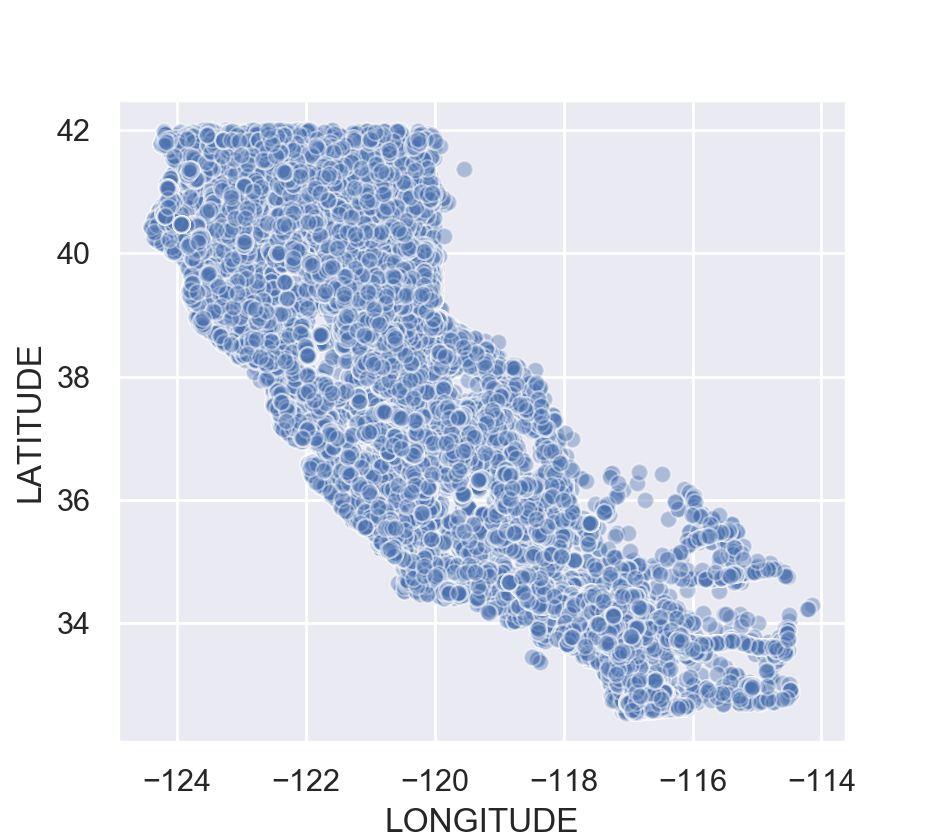

In [9]:
sns.scatterplot(x='LONGITUDE', y='LATITUDE', alpha=0.4, data=cali);

In [14]:
# date portions - encode later
cali['DATE'] = pd.to_datetime(cali['DISCOVERY_DATE'])
cali['MONTH'] = cali['DATE'].dt.month
cali['DAY_OF_WEEK'] = cali['DATE'].dt.dayofweek
cali['BURN_TIME'] = (pd.to_datetime(cali['CONT_DATE']) - cali['DATE']).astype(int)+1

cali.head()

,ID,LATITUDE,LONGITUDE,SOURCE_SYSTEM_TYPE,SOURCE_SYSTEM,FIRE_CODE,FIRE_NAME,FIRE_YEAR,DISCOVERY_DATE,DISCOVERY_DOY,...,EMXT,PRCP,TAVG,TMAX,TMIN,NEAR_FID,NEAR_DIST,MONTH,DAY_OF_WEEK,BURN_TIME
0,128764,38.900278,-120.002500,FED,FS-FIRESTAT,8525,WAGON,2000,2000/07/03 00:00:00+00,185,...,91.0,NaN,44.0,59.5,28.5,1759,1702.002813,7,Monday,1
1,128765,38.893889,-120.032222,FED,FS-FIRESTAT,8527,FALLEN,2000,2000/07/07 00:00:00+00,189,...,91.0,NaN,44.0,59.5,28.5,1450,844.446657,7,Friday,1
2,128766,38.900000,-119.983333,FED,FS-FIRESTAT,8514,HOSPITAL,2000,2000/05/02 00:00:00+00,123,...,91.0,NaN,44.0,59.5,28.5,99,1141.746990,5,Tuesday,1
3,128767,39.016944,-120.125000,FED,FS-FIRESTAT,8518,SIERRA,2000,2000/06/15 00:00:00+00,167,...,91.0,NaN,44.0,59.5,28.5,172,2029.504605,6,Thursday,1
4,128768,38.851389,-119.968333,FED,FS-FIRESTAT,8528,ONEIDAS III,2000,2000/07/03 00:00:00+00,185,...,91.0,NaN,44.0,59.5,28.5,1868,4435.980601,7,Monday,1


<IPython.core.display.Javascript object>


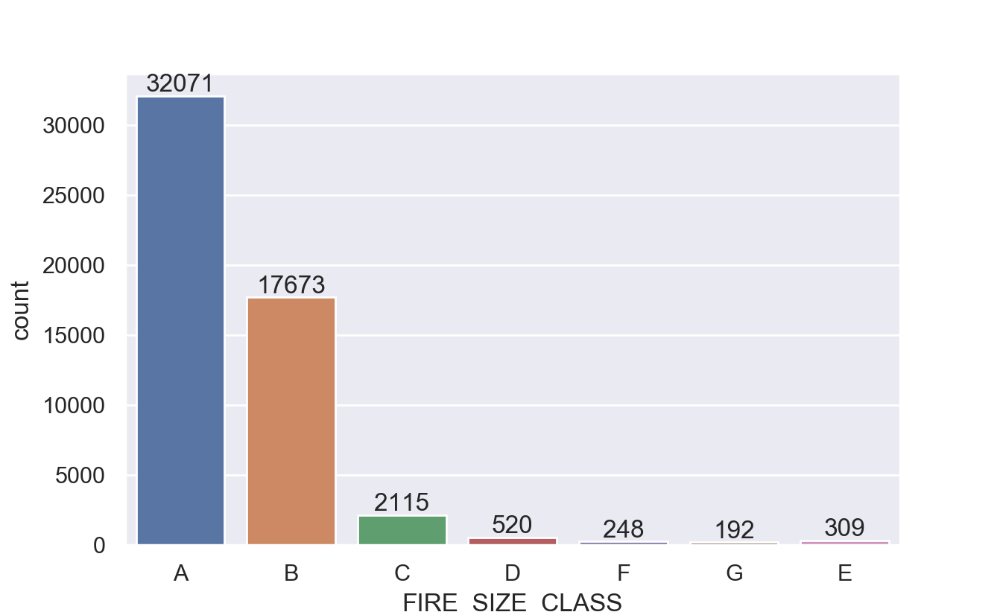

In [15]:
# fire size class
ax=sns.countplot(x="FIRE_SIZE_CLASS", data=cali)
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


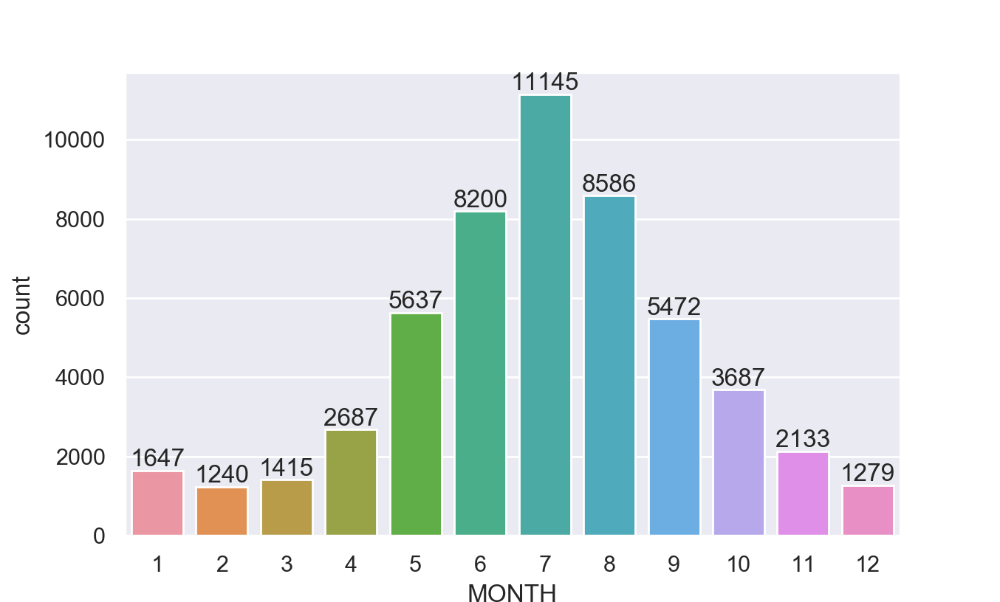

In [16]:
# monthly distribution
ax=sns.countplot(x=cali['MONTH'])
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


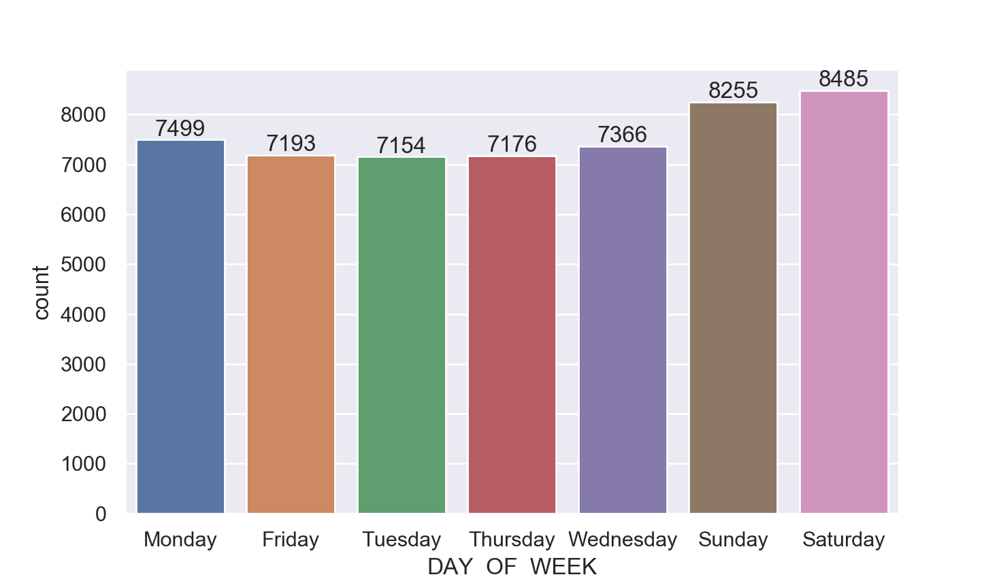

In [17]:
# weekday distribution
ax=sns.countplot(x=cali['DAY_OF_WEEK'])
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


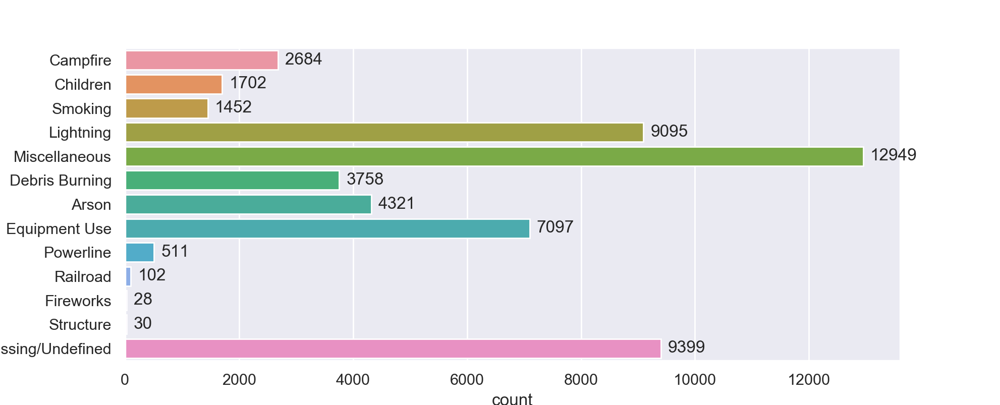

In [18]:
# cal fire causes
plt.figure(figsize=(5,5))
ax=sns.countplot(y='STAT_CAUSE_DESCR', data=cali)
for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center");

<IPython.core.display.Javascript object>


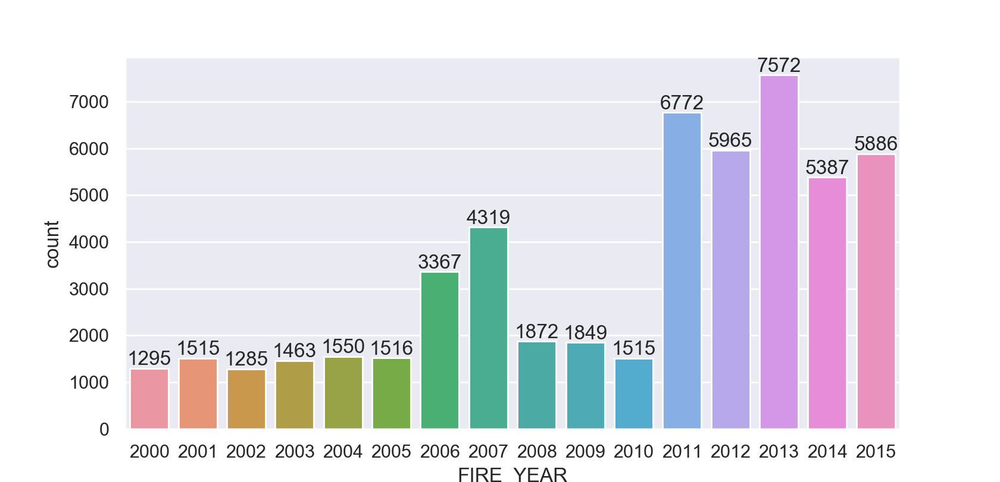

In [19]:
# year distribution
ax=sns.countplot(x=cali['FIRE_YEAR'])
for p in ax.patches:
    ax.annotate("%.f" % p.get_height(), xy=(p.get_x()+p.get_width()/2, p.get_height()),
            xytext=(0, 5), textcoords='offset points', ha="center", va="center");

<IPython.core.display.Javascript object>


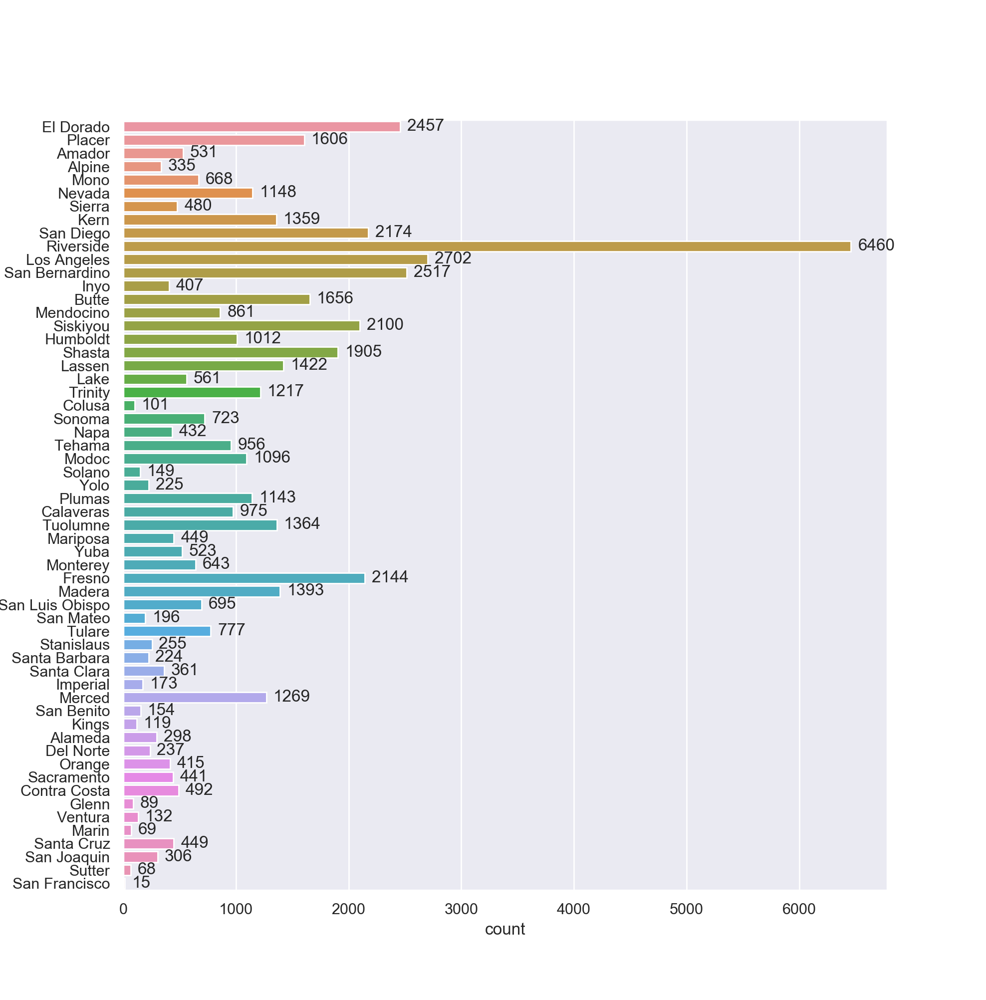

In [20]:
# cal fire county
plt.figure(figsize=(5,5))
ax=sns.countplot(y='County', data=cali)
for p in ax.patches:
    ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center");

In [23]:
# correlation
cor_drop = ['ID','FIRE_CODE', 'DISCOVERY_DATE','DISCOVERY_DOY', 'DISCOVERY_TIME', 
            'STAT_CAUSE_CODE','CONT_DATE', 'CONT_DOY', 'CONT_TIME','OWNER_CODE', 'FIPS_CODE',
           'DATE', 'NEAR_FID']

<IPython.core.display.Javascript object>


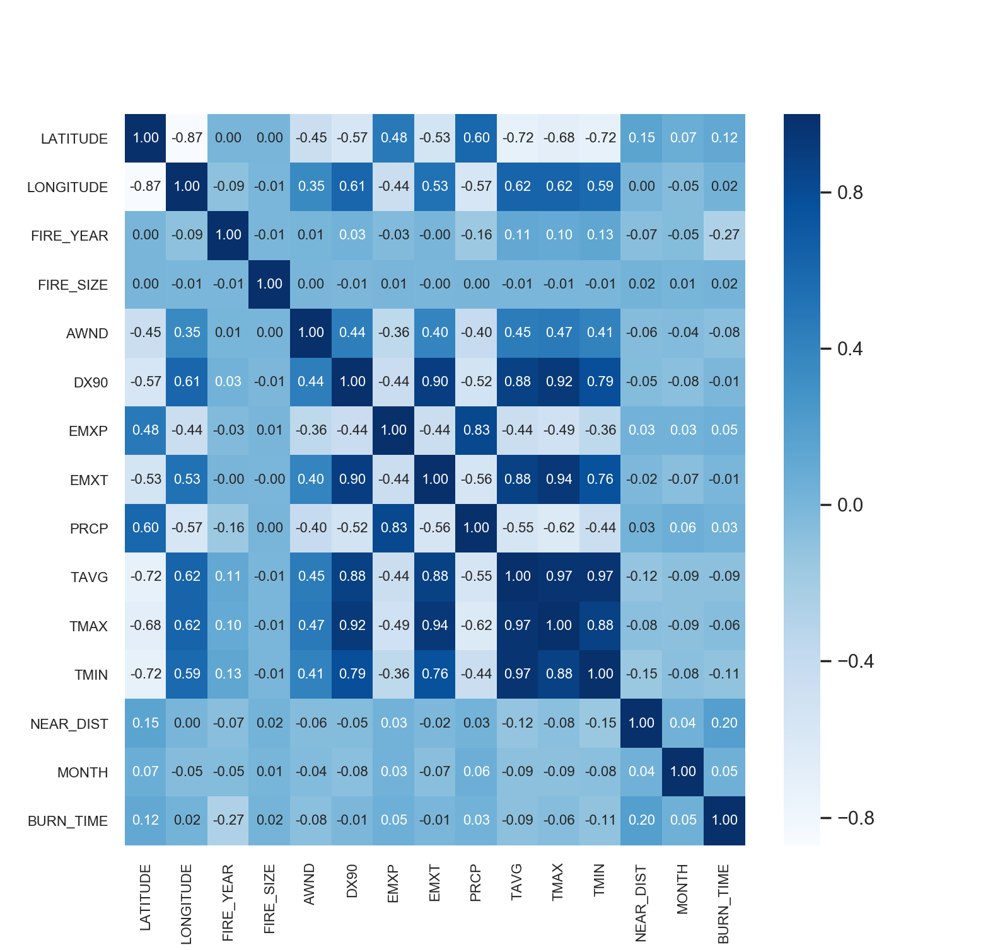

In [24]:
# correlation
sns.heatmap(cali.drop(cor_drop, axis=1).corr(), fmt='.2f', annot=True, annot_kws={"fontsize":8}, cmap="Blues")
plt.xticks(fontsize=8)
plt.yticks(fontsize=8);

<IPython.core.display.Javascript object>


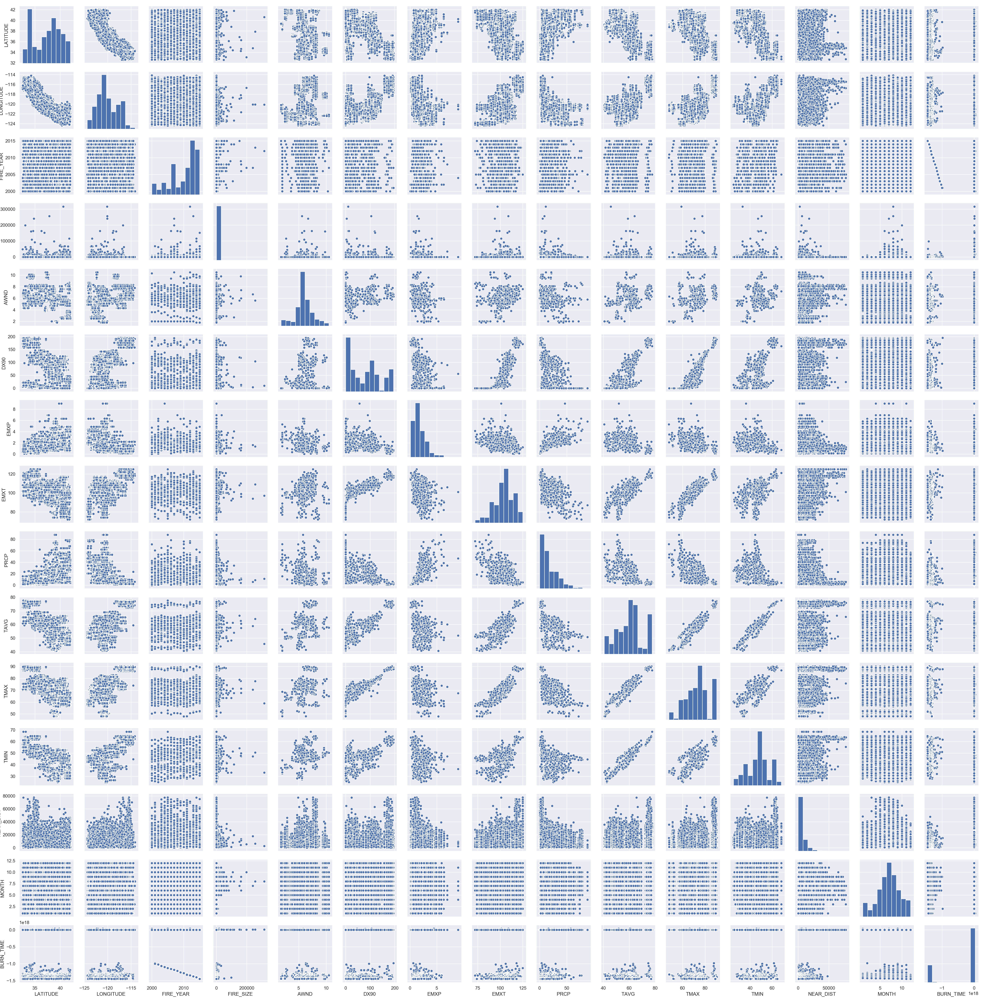

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning:

invalid value encountered in greater_equal

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning:

invalid value encountered in less_equal



In [25]:
# look at all continuous pairwise relationships
sns.pairplot(cali.drop(cor_drop, axis=1));

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:448: RuntimeWarning:

invalid value encountered in greater

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:448: RuntimeWarning:

invalid value encountered in less



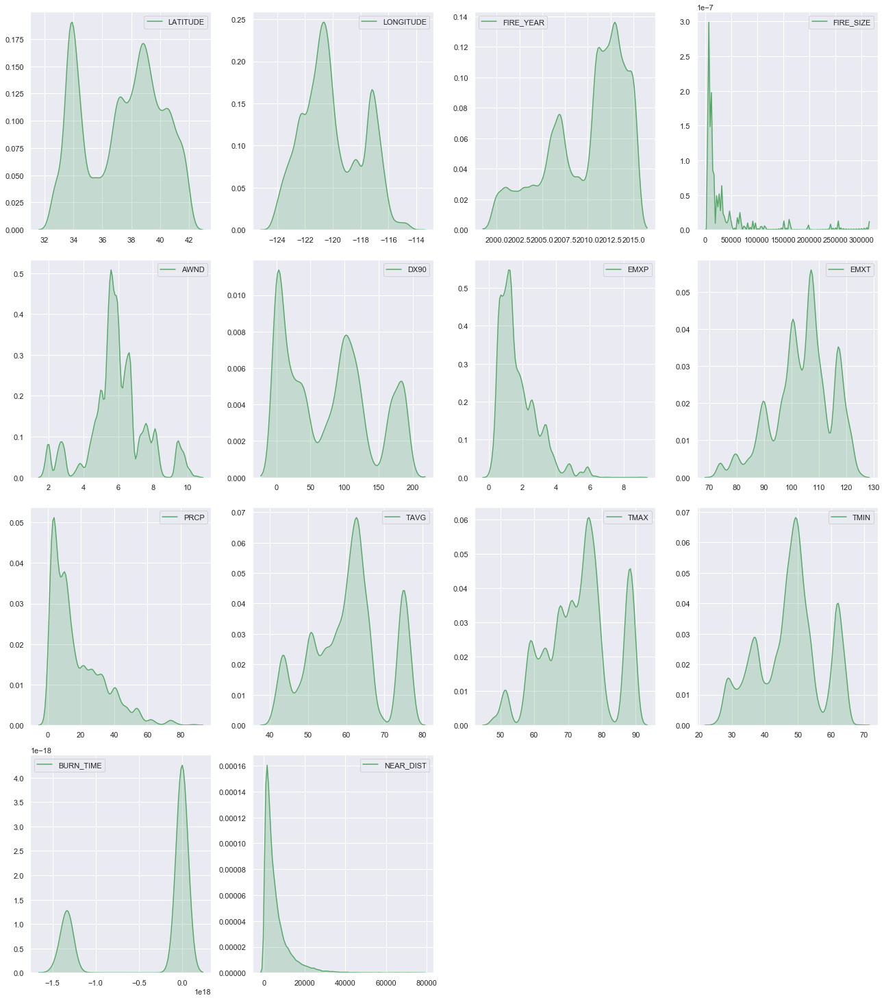

In [26]:
# look at continuous distributions
%matplotlib inline
num_columns1 = ['LATITUDE', 'LONGITUDE', 'FIRE_YEAR', 'FIRE_SIZE', 'AWND', 'DX90', 
                'EMXP', 'EMXT', 'PRCP', 'TAVG', 'TMAX','TMIN', 'BURN_TIME', 'NEAR_DIST']
plt.figure(figsize=(18,40))
for i,col in enumerate(num_columns1,1):
    plt.subplot(8,4,i)
    sns.kdeplot(cali[col],color='g',shade=True)
plt.tight_layout() 
plt.show()

In [33]:
# avg wildfire size by cause
cali.groupby(['STAT_CAUSE_DESCR'])[['FIRE_SIZE']].mean().sort_values(['FIRE_SIZE'],ascending=False)

,FIRE_SIZE
STAT_CAUSE_DESCR,
Structure,2522.675000
Lightning,308.250170
Miscellaneous,112.051126
Campfire,104.672232
Equipment Use,92.914481
Railroad,78.131275
Arson,72.397998
Missing/Undefined,60.894144
Debris Burning,53.933100


In [27]:
# average size and weather data by county
cali.groupby(['County'])[['FIRE_SIZE', 'TAVG',
                              'PRCP', 'DX90', 'EMXP']].mean().sort_values(['FIRE_SIZE'],ascending=False).head()

,FIRE_SIZE,TAVG,PRCP,DX90,EMXP
County,,,,,
Ventura,2113.776970,62.151515,8.023788,10.727273,1.579394
Santa Barbara,1717.905536,59.385714,9.464196,8.281250,1.659286
Colusa,524.094554,61.113861,16.030891,90.810000,1.344000
Trinity,477.327740,55.586360,31.758332,81.032868,2.217428
Monterey,448.635708,58.667807,10.158087,6.080871,1.389191


In [37]:
# look at count by year and cause
cali.groupby(['FIRE_YEAR', "STAT_CAUSE_DESCR"])['ID'].count().reset_index().sort_values(['ID'],ascending=False).head()

,FIRE_YEAR,STAT_CAUSE_DESCR,ID
142,2011,Missing/Undefined,2475
167,2013,Missing/Undefined,2203
166,2013,Miscellaneous,1800
154,2012,Missing/Undefined,1579
94,2007,Miscellaneous,1471


In [11]:
# get county names
cali["FIPS_NAME"].unique()

array(['El Dorado', 'Placer', 'Amador', 'Alpine', 'Mono', 'Nevada',
       'Sierra', 'Kern', 'San Diego', 'Riverside', 'Los Angeles',
       'San Bernardino', 'Inyo', 'Butte', 'Mendocino', 'Siskiyou',
       'Humboldt', 'Shasta', 'Lassen', 'Lake', 'Trinity', 'Colusa',
       'Sonoma', 'Napa', 'Tehama', 'Modoc', 'Solano', 'Yolo', 'Plumas',
       'Calaveras', 'Tuolumne', 'Mariposa', 'Yuba', 'Monterey', 'Fresno',
       'Madera', 'San Luis Obispo', 'San Mateo', 'Tulare', 'Stanislaus',
       'Santa Barbara', 'Santa Clara', 'Imperial', 'Merced', 'San Benito',
       'Kings', 'Alameda', 'Del Norte', 'Orange', 'Sacramento',
       'Contra Costa', 'Glenn', 'Ventura', 'Marin', 'Santa Cruz',
       'San Joaquin', 'Sutter', 'San Francisco'], dtype=object)